# Quick start: initializing, adding data, runing and saving your PyWGCNA

First, make sure to [install PyWGCNA](https://github.com/mortazavilab/PyWGCNA#readme).

I encourage you to look at [Data input, cleaning and pre-processing tutorial](Data%20format.md) before running PyWGCNA.

Then, download the example data from [here](https://github.com/mortazavilab/PyWGCNA/raw/main/tutorials/5xFAD_paper.zip) and decompress it.

For this tutorial, we will be using the gene expression matrix of 5xFAD mouse from the [MODEL-AD](https://www.model-ad.org/) project and [this paper](https://www.nature.com/articles/s41597-021-01054-y) in Scientific Data which has 5548 genes and 193 samples in four different time points.

## Setting up the PyWGCNA object

We use the TPM matrix to create a PyWGCNA object. The object serves as a container that contains expression data (i.e. TPM) and analysis results (like clustering, or visualizations) for an RNA-seq dataset. For a technical discussion of the PyWGCNA object structure, check out our [GitHub Wiki](https://github.com/mortazavilab/PyWGCNA/wiki). For example, the raw TPM matrix is stored in `GeneExp` class as an AnnData.

## **Note**

Depending on the amount of RAM on your machine, you may get an error during calculation of the TOM similarity matrix. In order to solve this problem, we suggest to remove one or two samples from each category or use another machine with more RAM.

**Compatible with PyWGCNA 2.0.0**

In [1]:
import PyWGCNA
geneExp = '5xFAD_paper/expressionList.csv'
pyWGCNA_5xFAD = PyWGCNA.WGCNA(name='5xFAD', 
                              species='mus musculus', #species of the data you use i.e mouse, human
                              geneExpPath=geneExp, #expression matrix which genes are in the rows and samples are columns
                              outputPath='', #path you want to save all you figures and object (default: ‘’, where you ran your script)
                              save=True)
pyWGCNA_5xFAD.geneExpr.to_df().head(5)

Saving data to be True, checking requirements ...


,ENSMUSG00000000003,ENSMUSG00000000028,ENSMUSG00000000031,ENSMUSG00000000037,ENSMUSG00000000049,ENSMUSG00000000056,ENSMUSG00000000058,ENSMUSG00000000078,ENSMUSG00000000085,ENSMUSG00000000088,...,ENSMUSG00000118383,ENSMUSG00000118384,ENSMUSG00000118385,ENSMUSG00000118386,ENSMUSG00000118387,ENSMUSG00000118388,ENSMUSG00000118389,ENSMUSG00000118390,ENSMUSG00000118391,ENSMUSG00000118392
sample_id,,,,,,,,,,,,,,,,,,,,,
X4mo_cortex_F_5xFADHEMI_430,0.0,1.90,0.00,0.13,0.43,22.37,24.24,19.32,33.41,620.45,...,0.75,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.04,0.0
X4mo_cortex_F_5xFADHEMI_431,0.0,1.10,0.06,0.07,0.18,16.99,24.69,23.88,31.40,705.73,...,0.67,0.0,0.55,0.43,0.0,0.0,0.0,0.0,0.00,0.0
X4mo_cortex_F_5xFADHEMI_433,0.0,1.18,0.07,0.13,1.90,20.37,28.06,21.33,32.14,699.50,...,0.91,0.0,0.00,0.19,0.0,0.0,0.0,0.0,0.02,0.0
X4mo_cortex_F_5xFADHEMI_434,0.0,2.18,0.00,0.07,0.31,17.98,21.46,15.06,27.60,639.95,...,0.11,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0
X4mo_cortex_F_5xFADHEMI_511,0.0,1.50,0.10,0.14,0.53,18.35,20.18,18.66,26.43,640.55,...,0.64,0.0,1.38,0.00,0.0,0.0,0.0,0.0,0.02,0.0


## Pre-processing workflow

PyWGCNA allows you to easily preproces the data including removing genes with too many missing values or lowly-expressed genes across samples (by default we suggest to remove genes without that are expressed below 1 TPM) and removing samples with too many missing values. Keep in your mind that these options can be adjusted by changing `TPMcutoff` and `cut`. 

Added: TPM was introduced in an attempt to facilitate comparisons across samples. TPM stands for transcript per million, and the sum of all TPM values is the same in all samples, such that a TPM value represents a relative expression level that, in principle, should be comparable between samples [18].

Pre-processing...
	Detecting genes and samples with too many missing values...
	Done pre-processing..



,ENSMUSG00000000003,ENSMUSG00000000028,ENSMUSG00000000031,ENSMUSG00000000037,ENSMUSG00000000049,ENSMUSG00000000056,ENSMUSG00000000058,ENSMUSG00000000078,ENSMUSG00000000085,ENSMUSG00000000088,...,ENSMUSG00000118383,ENSMUSG00000118384,ENSMUSG00000118385,ENSMUSG00000118386,ENSMUSG00000118387,ENSMUSG00000118388,ENSMUSG00000118389,ENSMUSG00000118390,ENSMUSG00000118391,ENSMUSG00000118392
sample_id,,,,,,,,,,,,,,,,,,,,,
X4mo_cortex_F_5xFADHEMI_430,0.0,1.90,0.00,0.13,0.43,22.37,24.24,19.32,33.41,620.45,...,0.75,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.04,0.0
X4mo_cortex_F_5xFADHEMI_431,0.0,1.10,0.06,0.07,0.18,16.99,24.69,23.88,31.40,705.73,...,0.67,0.0,0.55,0.43,0.0,0.0,0.0,0.0,0.00,0.0
X4mo_cortex_F_5xFADHEMI_433,0.0,1.18,0.07,0.13,1.90,20.37,28.06,21.33,32.14,699.50,...,0.91,0.0,0.00,0.19,0.0,0.0,0.0,0.0,0.02,0.0
X4mo_cortex_F_5xFADHEMI_434,0.0,2.18,0.00,0.07,0.31,17.98,21.46,15.06,27.60,639.95,...,0.11,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0
X4mo_cortex_F_5xFADHEMI_511,0.0,1.50,0.10,0.14,0.53,18.35,20.18,18.66,26.43,640.55,...,0.64,0.0,1.38,0.00,0.0,0.0,0.0,0.0,0.02,0.0


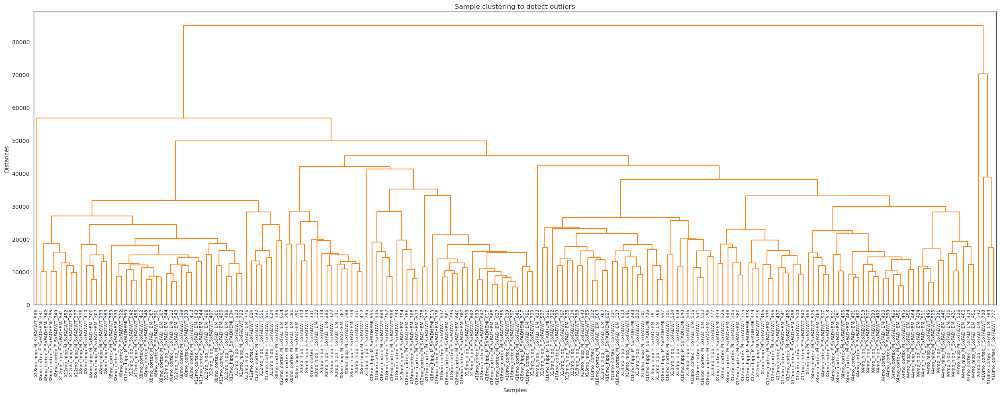

In [2]:
pyWGCNA_5xFAD.preprocess()
pyWGCNA_5xFAD.geneExpr.to_df().head(5)

## Construction of the gene network and identification of modules

PyWGCNA compresses all the steps of network construction and module detection in one function called `findModules` which performs the following steps:
1. Choosing the soft-thresholding power: analysis of network topology
2. Co-expression similarity and adjacency
3. Topological Overlap Matrix (TOM) "While the adjacency matrix considers each pair of genes in isolation, topological overlap considers each pair of genes in relation to all other genes in the network. More specifically, genes are said to have high topological overlap if they are connected to roughly the same group of genes in the network (i.e. they share the same neighborhood). To calculate the topological overlap for a pair of genes, their connections with all other genes in the network are compared. If the 2 nodes connect to the same group of other nodes, then they have a high 'topological overlap'".
4. Clustering using TOM
5. Merging of modules whose expression profiles are very similar

Run WGCNA...
pickSoftThreshold: calculating connectivity for given powers...
will use block size  1876


    Power  SFT.R.sq     slope truncated R.sq      mean(k)    median(k)  \
0       1  0.368857 -0.481613       0.701585  2444.750756  2260.416614   
1       2    0.7253  -0.99165       0.886361   840.665489   673.081241   
2       3  0.791986 -1.194264       0.946969   385.685335   258.451265   
3       4  0.835392   -1.3419       0.968446   207.404152   113.456087   
4       5  0.853842 -1.472183       0.973346   123.232581    54.784481   
5       6  0.870673 -1.553348       0.979584    78.455923     28.47124   
6       7  0.886736 -1.600869       0.986635    52.572016    15.594822   
7       8  0.896672 -1.639343       0.992373     36.65884     9.454046   
8       9  0.903531 -1.677747       0.994643    26.397061     6.024431   
9      10  0.906045 -1.706474       0.995895    19.521431     3.975959   
10     11  0.905582 -1.731076       0.994806    14.767291     2.623921   
11     13  0.914482 -1.751347       0.997466     8.941254     1.205108   
12     15  0.912684 -1.771227       0.

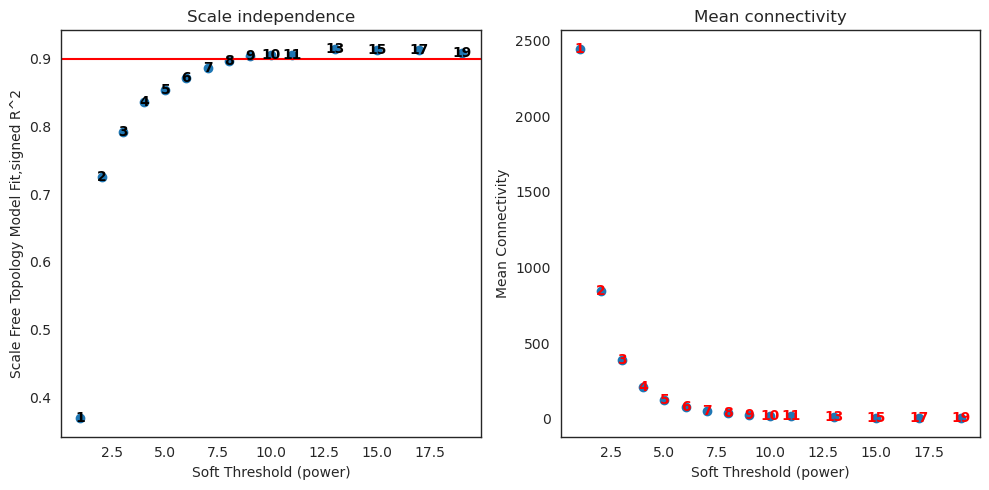

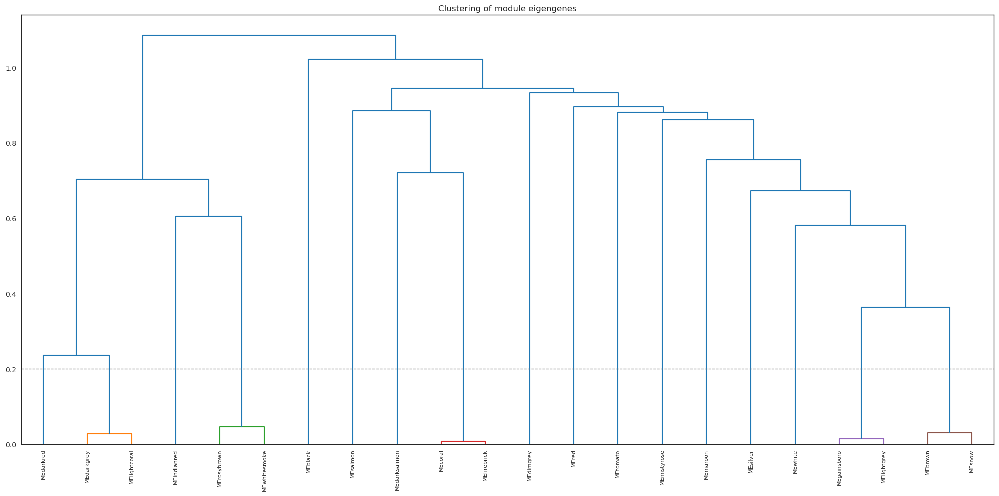

In [4]:
pyWGCNA_5xFAD.findModules()

We also can merge two previous steps by calling `runWGCNA()` function.

### Updating sample information and assiging color to them for dowstream analysis

In [5]:
pyWGCNA_5xFAD.updateSampleInfo(path='5xFAD_paper/sampleInfo.csv', sep=',')

# add color for metadata
pyWGCNA_5xFAD.setMetadataColor('Sex', {'Female': 'green',
                                       'Male': 'yellow'})
pyWGCNA_5xFAD.setMetadataColor('Genotype', {'5xFADWT': 'darkviolet',
                                            '5xFADHEMI': 'deeppink'})
pyWGCNA_5xFAD.setMetadataColor('Age', {'4mon': 'thistle',
                                       '8mon': 'plum',
                                       '12mon': 'violet',
                                       '18mon': 'purple'})
pyWGCNA_5xFAD.setMetadataColor('Tissue', {'Hippocampus': 'red',
                                          'Cortex': 'blue'})

### Updating gene information
get table that map gene ensembl id to gene name from biomart

espcially adding gene name for doing downstream analysis



In [6]:
geneList = PyWGCNA.getGeneList(dataset='mmusculus_gene_ensembl',
                               attributes=['ensembl_gene_id', 
                                           'external_gene_name', 
                                           'gene_biotype'],
                               maps=['gene_id', 'gene_name', 'gene_biotype'])


pyWGCNA_5xFAD.updateGeneInfo(geneList)

**note**: For doing downstream analysis, we keep aside the Gray modules which is the collection of genes that could not be assigned to any other module.

## Relating modules to external information and identifying important genes
PyWGCNA gather some important analysis after identifying modules in `analyseWGCNA()` function including:

Analysing results: 1.calculating module trait relationship 2.plotting module heatmap eigengene 3.finding GO term for each module

1. Quantifying module–trait relationship 
2. Gene relationship to trait and modules
3. Gene-ontology analysis

Keep in your mind before you start analysis to add any sample or gene information.

For showing module relationship heatmap, PyWGCNA needs user to choose and set colors from [Matplotlib colors](https://matplotlib.org/stable/gallery/color/named_colors.html) for metadata by using `setMetadataColor()` function.

You also can select which data trait in which order you wish to show in module eigengene heatmap

Analysing WGCNA...
Calculating module trait relationship ...
	Done..

Adding (signed) eigengene-based connectivity (module membership) ...
	Done..

plotting module heatmap eigengene...
	Done..

plotting module barplot eigengene...
	Done..

doing Enrichr GO analysis for each module...
GO directory does not exist!
Creating GO directory!
	Done..



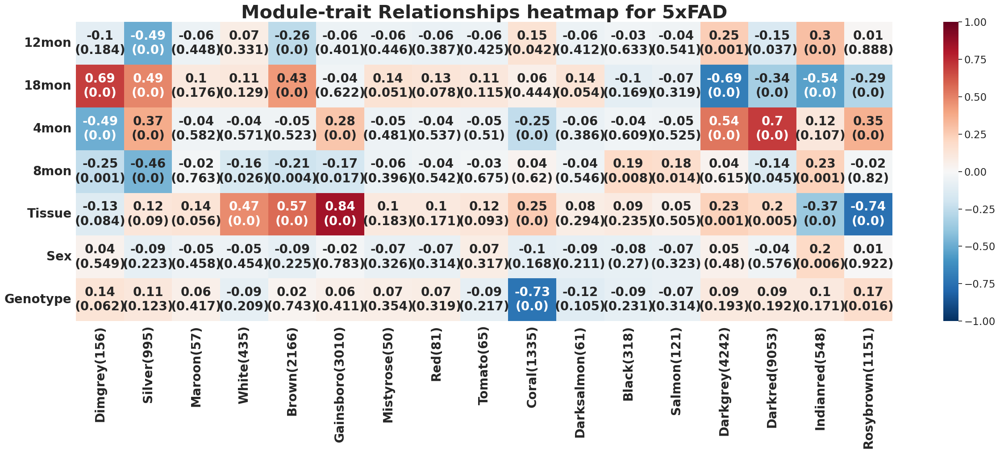

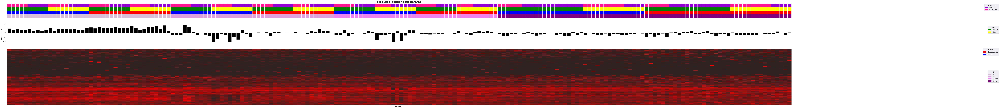

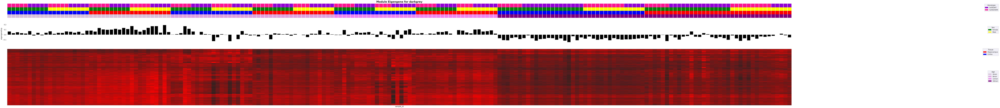

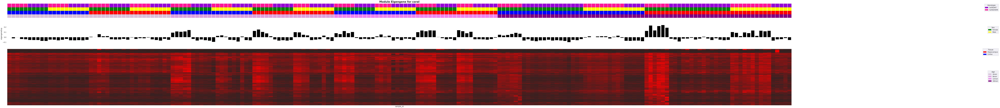

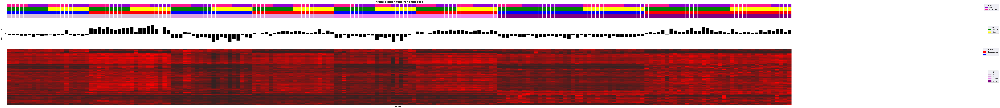

...

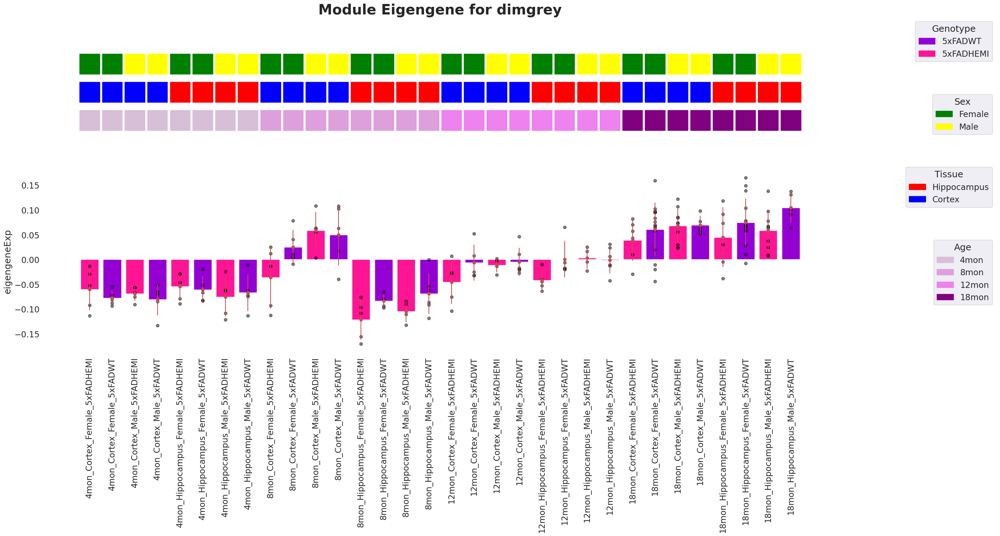

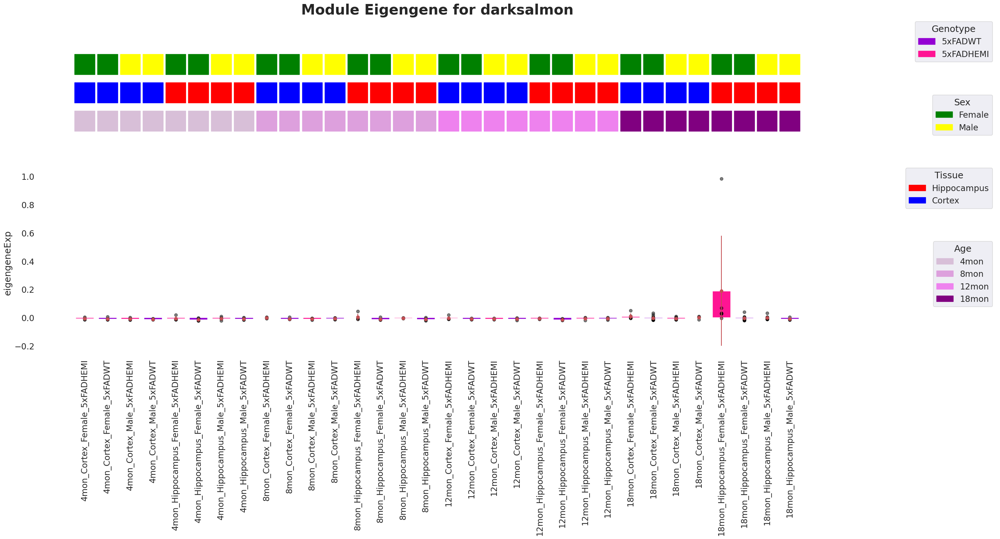

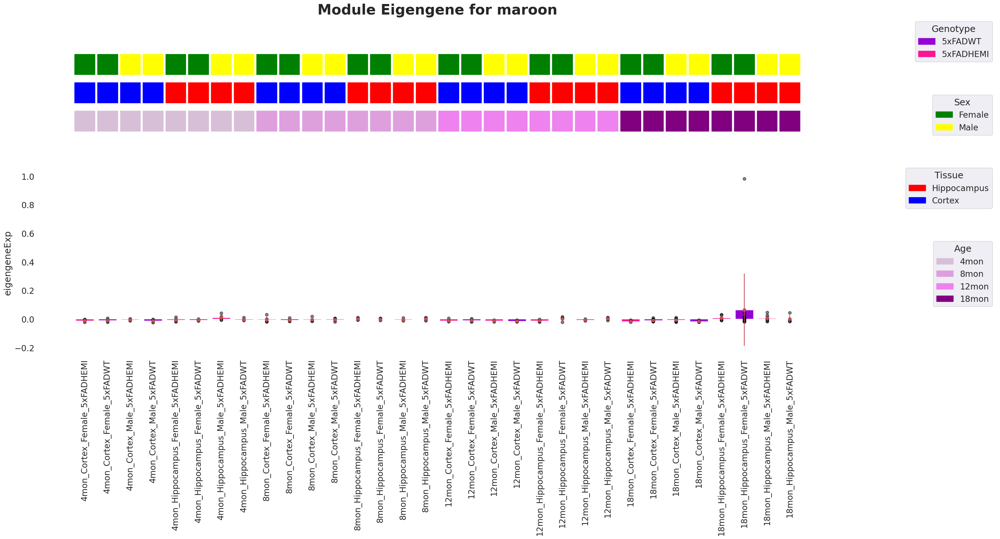

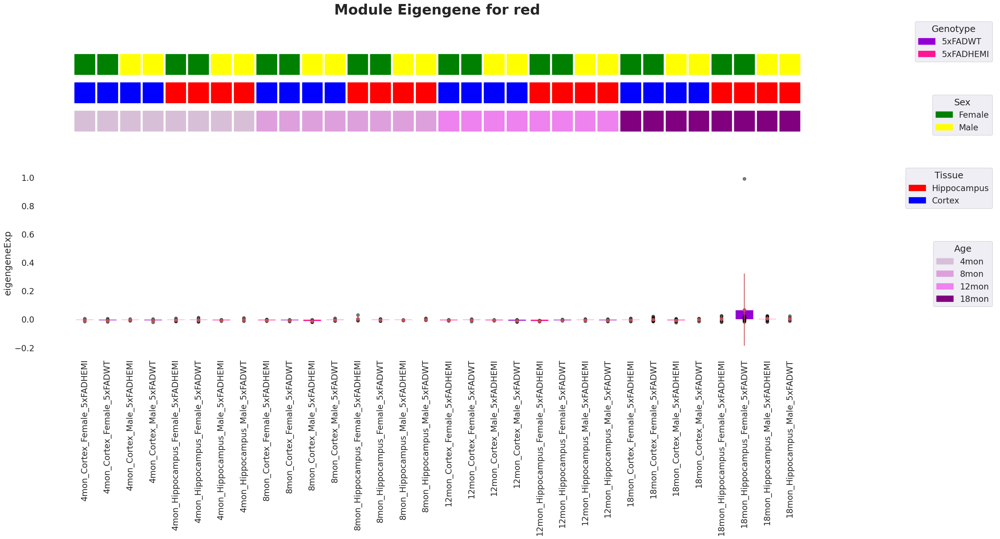

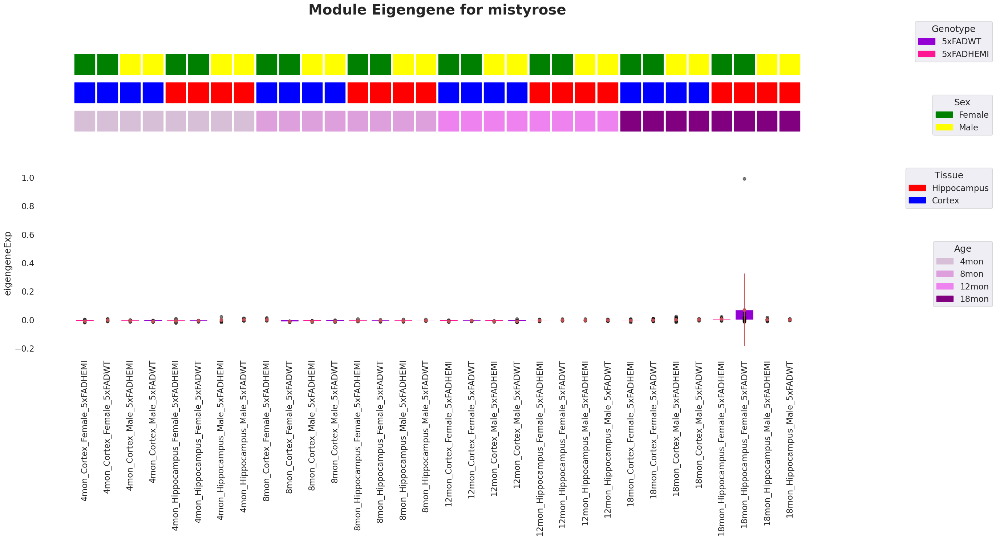

In [7]:
pyWGCNA_5xFAD.analyseWGCNA()

## Saving and loading your PyWGCNA
You can save or load your PyWGCNA object with the `saveWGCNA()` or `readWGCNA()` functions respectively.

In [8]:
pyWGCNA_5xFAD.saveWGCNA()

Saving WGCNA as 5xFAD.p


you can also load your PyWGCNA object with `readWGCNA()` function. you can download `5xFAD.p` from [Zendo](https://zenodo.org/record/6672453#.YrDS4LnMJhE).

In [1]:
import PyWGCNA
pyWGCNA_5xFAD = PyWGCNA.readWGCNA("5xFAD.p")

Reading 5xFAD WGCNA done!


## Finding hub genes for each modules

you can also ask about hub genes in each modules based on their connectivity by using `top_n_hub_genes()` function.

It will give you dataframe sorted by connectivity with additional gene information you have in your expression data.

In [9]:
pyWGCNA_5xFAD.top_n_hub_genes(moduleName="coral", n=10)

calculating adjacency matrix ...
	Done..



,connectivity,dynamicColors,moduleColors,moduleLabels,gene_name,gene_biotype
ENSMUSG00000036905,142.377574,coral,coral,2.0,C1qb,protein_coding
ENSMUSG00000038642,138.650424,coral,coral,2.0,Ctss,protein_coding
ENSMUSG00000021665,135.848008,coral,coral,2.0,Hexb,protein_coding
ENSMUSG00000036896,134.358788,coral,coral,2.0,C1qc,protein_coding
ENSMUSG00000000290,134.030810,coral,coral,2.0,Itgb2,protein_coding
ENSMUSG00000058715,132.936332,coral,coral,2.0,Fcer1g,protein_coding
ENSMUSG00000030124,131.812832,coral,coral,2.0,Lag3,protein_coding
ENSMUSG00000064267,130.008128,coral,coral,2.0,Hvcn1,protein_coding
ENSMUSG00000021423,129.823495,coral,coral,2.0,Ly86,protein_coding
ENSMUSG00000030798,128.650320,coral,coral,2.0,Cd37,protein_coding
